In [1]:
import pandas as pd
import json
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.utils import resample
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
from interpret import show
import lime
import lime.lime_tabular
import shap
import warnings
warnings.filterwarnings('ignore')

import sys
sys.path.append('../src') 

from data_pipeline.extractor import execute_query
from gams.logistic_gam import train_logistic_gam_model
from gams.ebm_gam import train_ebm_model, display_global_explanation_with_full_feature_names
from ml_models.random_forest import train_random_forest_model
from ml_models.evalauion_results import evaluate_model
from ml_models.xgb_model import train_xgboost_model

In [2]:
query = """
SELECT s.*, a.hospital_expire_flag as mortality
FROM sapsii s
LEFT JOIN admissions a
ON s.subject_id = a.subject_id
AND s.hadm_id = a.hadm_id;
"""

df = execute_query(query)

# 1. SAPSII Traditional Scoring Model

In [3]:
df_sapsii = df.copy()
df_sapsii['sapsii_binary'] = (df_sapsii['sapsii_prob'] >= 0.5).astype(int)

# Exclude specific columns
df_sapsii_filtered = df_sapsii.drop(columns=['subject_id', 'hadm_id', 'icustay_id', 'sapsii'])

# Replace NaNs with 0
df_sapsii_filtered = df_sapsii_filtered.fillna(0)

# Separate features and target variable
y_true = df_sapsii_filtered['mortality']

sapsii_pred_on_X = df_sapsii_filtered[["sapsii_binary","sapsii_prob"]]


# Split the balanced data into training and test sets
X_train_sapsii_pred, X_test_sapsii_pred, y_train, y_test = train_test_split(sapsii_pred_on_X, y_true, test_size=0.2, random_state=42, stratify=y_true)

# Print class distribution after the split
print("Training set class distribution:")
print(y_train.value_counts())

print("Test set class distribution:")
print(y_test.value_counts())

Training set class distribution:
mortality
0    43938
1     5287
Name: count, dtype: int64
Test set class distribution:
mortality
0    10985
1     1322
Name: count, dtype: int64


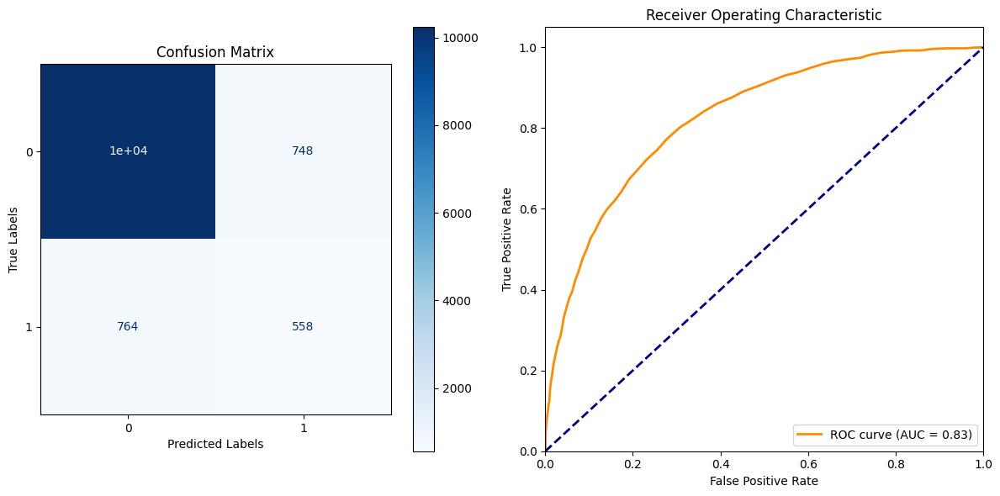

SAPSII Traditional Scoring Model:

ROC AUC Score: 0.8269
Precision-Recall AUC Score: 0.4144
Training Accuracy: 0.8781
Test Accuracy: 0.8771
F1 Score: 0.4247

Confusion Matrix:
[[10237   748]
 [  764   558]]
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.93      0.93     10985
           1       0.43      0.42      0.42      1322

    accuracy                           0.88     12307
   macro avg       0.68      0.68      0.68     12307
weighted avg       0.88      0.88      0.88     12307



In [4]:
y_pred_sapsii = X_test_sapsii_pred['sapsii_binary']
y_pred_prob_sapsii = X_test_sapsii_pred['sapsii_prob']

evaluation_results_sapsii = evaluate_model(y_test, y_pred_sapsii, y_pred_prob_sapsii)

# Print the ROC AUC and Precision-Recall AUC Scores
print("SAPSII Traditional Scoring Model:\n")
print(f"ROC AUC Score: {evaluation_results_sapsii['roc_auc']:.4f}")
print(f"Precision-Recall AUC Score: {evaluation_results_sapsii['roc_prc']:.4f}")
print(f"Training Accuracy: {accuracy_score(y_train,X_train_sapsii_pred['sapsii_binary']):.4f}")
print(f"Test Accuracy: {evaluation_results_sapsii['test_accuracy']:.4f}")
print(f"F1 Score: {evaluation_results_sapsii['f1_score']:.4f}")

# Print the Confusion Matrix
print("\nConfusion Matrix:")
print(evaluation_results_sapsii['confusion_matrix'])

report_sapsii = evaluation_results_sapsii['classification_report']
print("Classification Report:\n", report_sapsii)

# Train-Test Split and Standardization

In [5]:
df_models = df.copy()

# Exclude specific columns
df_filtered = df_models.drop(columns=['subject_id', 'hadm_id', 'icustay_id', 'sapsii', 'sapsii_prob'])

# Replace NaNs with 0
df_filtered = df_filtered.fillna(0)

# Separate features and target variable
y = df_filtered['mortality']
X = df_filtered.drop(columns=['mortality'])

# Split the balanced data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Print class distribution after the split
print("Training set class distribution:")
print(y_train.value_counts())

print("Test set class distribution:")
print(y_test.value_counts())

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

Training set class distribution:
mortality
0    43938
1     5287
Name: count, dtype: int64
Test set class distribution:
mortality
0    10985
1     1322
Name: count, dtype: int64


# 2. LogisticGam Model

In [6]:
# Save the best configurations to a JSON file
config_file_path = Path("../hyperparameter_tuning_optuna/logisticgam_sapsii_best_configs.json")

# Load the saved configuration (if it exists)
if config_file_path.exists():
    with open(config_file_path, "r") as config_file:
        best_configs = json.load(config_file)

best_params = best_configs["best_params"]

terms_option = best_params["terms_option"]
max_iter = best_params["max_iter"]
tol = best_params["tol"]
fit_intercept = best_params["fit_intercept"]

print(json.dumps(best_params, indent=4))

{
    "terms_option": "auto",
    "max_iter": 100,
    "tol": 0.0001,
    "fit_intercept": true
}


LogisticGAM                                                                                               
=============================================== ==========================================================
Distribution:                      BinomialDist Effective DoF:                                     38.9674
Link Function:                        LogitLink Log Likelihood:                                -12567.9528
Number of Samples:                        49225 AIC:                                            25213.8404
                                                AICc:                                            25213.907
                                                UBRE:                                               2.5128
                                                Scale:                                                 1.0
                                                Pseudo R-Squared:                                   0.2514
Feature Function                  Lam

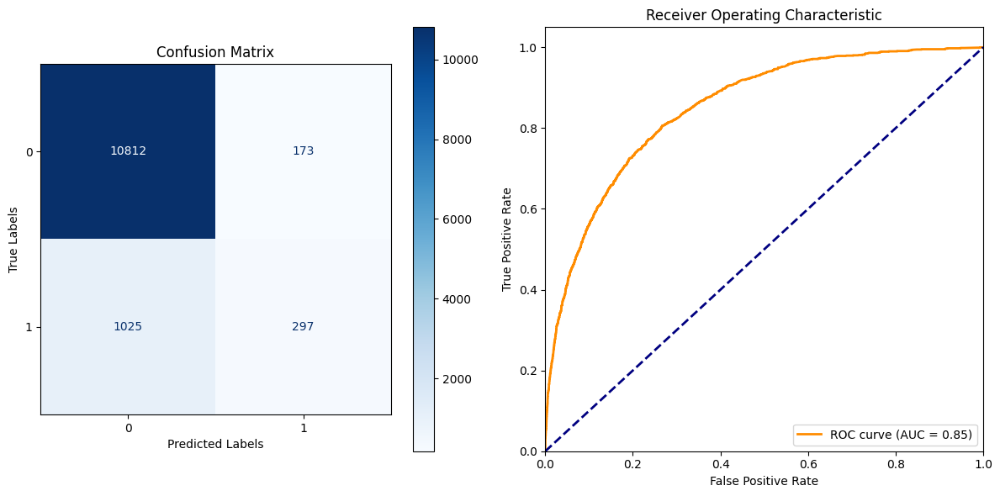

LogisticGAM Model:

ROC AUC Score: 0.8504
Precision-Recall AUC Score: 0.4667
Training Accuracy: 0.9029
Test Accuracy: 0.9027
F1 Score: 0.3315

Confusion Matrix:
[[10812   173]
 [ 1025   297]]
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.98      0.95     10985
           1       0.63      0.22      0.33      1322

    accuracy                           0.90     12307
   macro avg       0.77      0.60      0.64     12307
weighted avg       0.88      0.90      0.88     12307



In [7]:
model_lr, results_lr = train_logistic_gam_model(X_train_scaled, y_train, X_test_scaled, terms=terms_option, 
                                                max_iter=max_iter, tol=tol, fit_intercept=fit_intercept, include_summary=True)

evaluation_results_lr = evaluate_model(y_test, results_lr['y_pred'], results_lr['y_pred_prob'])

# Print the ROC AUC and Precision-Recall AUC Scores
print("LogisticGAM Model:\n")
print(f"ROC AUC Score: {evaluation_results_lr['roc_auc']:.4f}")
print(f"Precision-Recall AUC Score: {evaluation_results_lr['roc_prc']:.4f}")
print(f"Training Accuracy: {results_lr['training_accuracy']:.4f}")
print(f"Test Accuracy: {evaluation_results_lr['test_accuracy']:.4f}")
print(f"F1 Score: {evaluation_results_lr['f1_score']:.4f}")


# Print the Confusion Matrix
print("\nConfusion Matrix:")
print(evaluation_results_lr['confusion_matrix'])

report_lr = evaluation_results_lr['classification_report']
print("Classification Report:\n", report_lr)

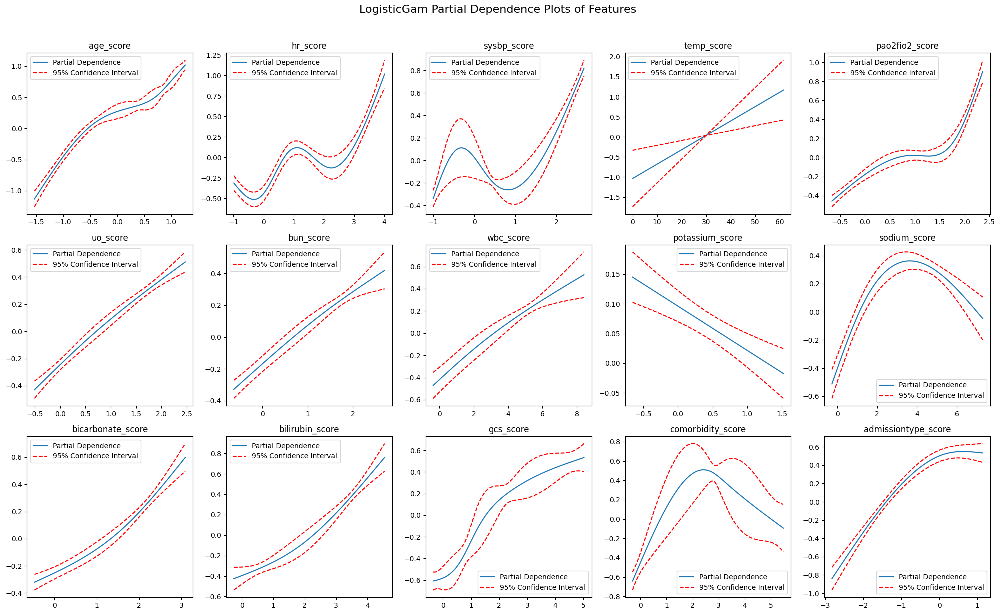

In [68]:
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(20, 12))  # Adjust figsize as needed
axes = axes.flatten()  # Flatten the axes array for easier indexing

# Loop over the terms and plot
for i, term in enumerate(model_lr.terms):
    if term.isintercept:
        continue

    # Generate data for plotting
    XX = model_lr.generate_X_grid(term=i)
    pdep, confi = model_lr.partial_dependence(term=i, X=XX, width=0.95)

    # Get the current axis to plot on
    ax = axes[i]
    ax.plot(XX[:, term.feature], pdep, label='Partial Dependence')
    ax.plot(XX[:, term.feature], confi, c='r', ls='--')

    ax.set_title(X.columns[i])

    ax.legend(['Partial Dependence', '95% Confidence Interval'])

# Set a main title for the entire figure
fig.suptitle('LogisticGam Partial Dependence Plots of Features', fontsize=16, y=1.02)

# Adjust layout to avoid overlapping titles and labels
plt.tight_layout()
plt.show()


# 3. EBM Model

In [83]:
# Save the best configurations to a JSON file
config_file_path = Path("../hyperparameter_tuning_optuna/ebm_sapsii_best_configs.json")

# Load the saved configuration (if it exists)
if config_file_path.exists():
    with open(config_file_path, "r") as config_file:
        best_configs = json.load(config_file)
else:
    raise FileNotFoundError(f"Configuration file not found at {config_file_path}")

# Extracting the best parameters
best_params = best_configs["best_params"]
 
print(json.dumps(best_params, indent=4))

{
    "max_bins": 839,
    "max_interaction_bins": 23,
    "interactions": 0,
    "outer_bags": 19,
    "inner_bags": 3,
    "learning_rate": 0.018033149132975924,
    "min_samples_leaf": 43,
    "max_leaves": 4,
    "max_rounds": 14383,
    "early_stopping_rounds": 29,
    "smoothing_rounds": 161,
    "greedy_ratio": 1.228248604505462
}


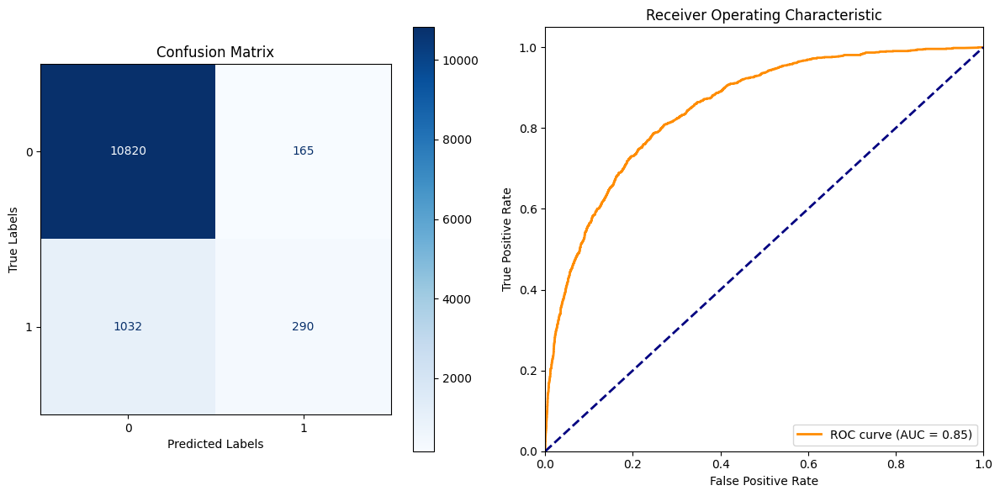

EBM Model: 

ROC AUC Score: 0.8505
Precision-Recall AUC Score: 0.4658
Training Accuracy: 0.9029
Test Accuracy: 0.9027
F1 Score: 0.3264

Confusion Matrix:
[[10820   165]
 [ 1032   290]]
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.98      0.95     10985
           1       0.64      0.22      0.33      1322

    accuracy                           0.90     12307
   macro avg       0.78      0.60      0.64     12307
weighted avg       0.88      0.90      0.88     12307



In [84]:
model_ebm, results_ebm = train_ebm_model(X_train_scaled, y_train, X_test_scaled, **best_params)

evaluation_results_ebm = evaluate_model(y_test, results_ebm['y_pred'], results_ebm['y_pred_prob'])

print("EBM Model: \n")
print(f"ROC AUC Score: {evaluation_results_ebm['roc_auc']:.4f}")
print(f"Precision-Recall AUC Score: {evaluation_results_ebm['roc_prc']:.4f}")
print(f"Training Accuracy: {results_ebm['training_accuracy']:.4f}")
print(f"Test Accuracy: {evaluation_results_ebm['test_accuracy']:.4f}")
print(f"F1 Score: {evaluation_results_ebm['f1_score']:.4f}")

print("\nConfusion Matrix:")
print(evaluation_results_ebm['confusion_matrix'])

report_ebm = evaluation_results_ebm['classification_report']
print("Classification Report:\n", report_ebm)

In [85]:
display_global_explanation_with_full_feature_names(model_ebm, X.columns)

<!-- http://127.0.0.1:7001/2744280449344/ -->

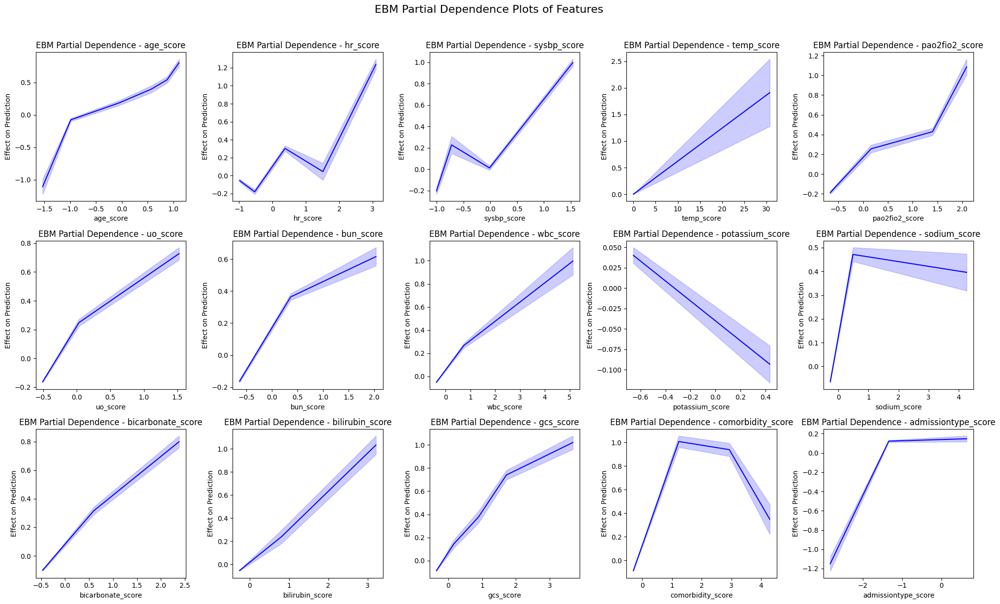

In [86]:
def plot_ebm_pdp(model_ebm, feature_to_plot, feature_names, ax):
    # Get the index of the feature to plot
    feature_idx = feature_names.index(feature_to_plot)
    
    # Obtain global explanation for the EBM model
    ebm_global = model_ebm.explain_global()
    
    # Extract data for the specified feature
    data = ebm_global.data(feature_idx)
    
    # Ensure the dimensions match for plotting
    plot_length = min(len(data['names']), len(data['scores']))
    
    # Plot the partial dependence plot for the specified feature on the given axis
    ax.plot(data['names'][:plot_length], data['scores'][:plot_length], color='blue', label='Partial Dependence')
    ax.fill_between(data['names'][:plot_length], data['lower_bounds'][:plot_length], data['upper_bounds'][:plot_length], color='blue', alpha=0.2, label='95% CI')
    
    # Set plot title and labels
    ax.set_title(f"EBM Partial Dependence - {feature_to_plot}")
    ax.set_xlabel(feature_to_plot)
    ax.set_ylabel("Effect on Prediction")

# Example Workflow
feature_names = X.columns.tolist()  # Assuming X is your original DataFrame with column names

fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(20, 12))  # Adjust figsize as needed
axes = axes.flatten()  # Flatten the axes array for easier indexing

# Loop through all features and plot on the corresponding axes
for i, feature in enumerate(feature_names):
    if i >= len(axes):
        break  # Avoid indexing issues if there are more features than subplot slots
    plot_ebm_pdp(model_ebm, feature, feature_names, axes[i])

# Set a main title for the entire figure
fig.suptitle('EBM Partial Dependence Plots of Features', fontsize=16, y=1.02)

# Adjust layout to avoid overlapping titles and labels
plt.tight_layout()
plt.show()

# 4. Random Forest Model

In [12]:
# Save the best configurations to a JSON file
config_file_path = Path("../hyperparameter_tuning_optuna/random_forest_sapsii_best_configs.json")

# Load the saved configuration (if it exists)
if config_file_path.exists():
    with open(config_file_path, "r") as config_file:
        best_configs = json.load(config_file)
else:
    raise FileNotFoundError(f"Configuration file not found at {config_file_path}")

# Extracting the best parameters
best_params = best_configs["best_params"]
 
print(json.dumps(best_params, indent=4))

{
    "n_estimators": 280,
    "criterion": "entropy",
    "max_depth": 26,
    "min_samples_split": 2,
    "min_samples_leaf": 1,
    "min_weight_fraction_leaf": 0.0011723691519857603,
    "max_features": "log2",
    "max_leaf_nodes": 100,
    "min_impurity_decrease": 0.00020712905189035043,
    "bootstrap": false,
    "class_weight": null,
    "ccp_alpha": 0.00026469427540157535
}


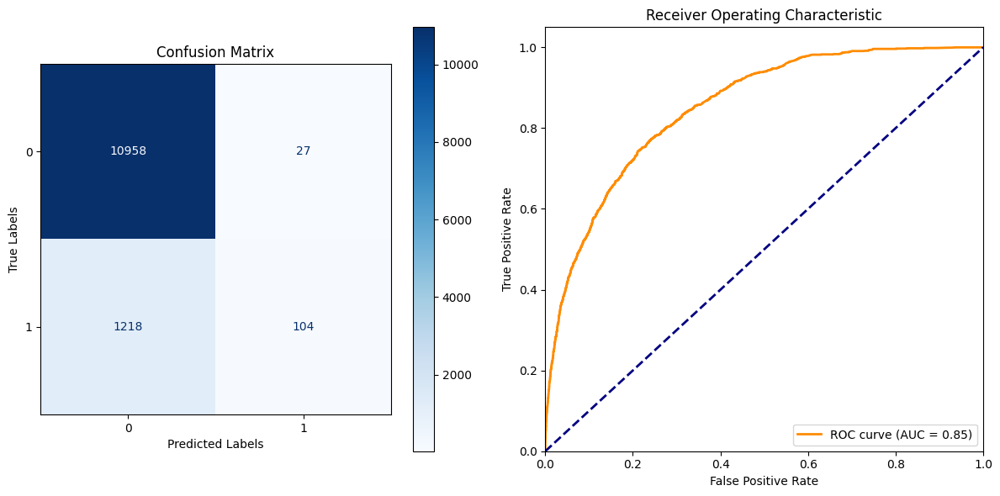

Random Forest Model: 

ROC AUC Score: 0.8512
Precision-Recall AUC Score: 0.4638
Training Accuracy: 0.9001
Test Accuracy: 0.8988
F1 Score: 0.1432

Confusion Matrix:
[[10958    27]
 [ 1218   104]]
Classification Report:
               precision    recall  f1-score   support

           0       0.90      1.00      0.95     10985
           1       0.79      0.08      0.14      1322

    accuracy                           0.90     12307
   macro avg       0.85      0.54      0.54     12307
weighted avg       0.89      0.90      0.86     12307



In [13]:
model_rf, results_rf = train_random_forest_model(X_train_scaled, y_train, X_test_scaled, **best_params)

evaluation_results_rf = evaluate_model(y_test, results_rf['y_pred'], results_rf['y_pred_prob'])

print("Random Forest Model: \n")
print(f"ROC AUC Score: {evaluation_results_rf['roc_auc']:.4f}")
print(f"Precision-Recall AUC Score: {evaluation_results_rf['roc_prc']:.4f}")
print(f"Training Accuracy: {results_rf['training_accuracy']:.4f}")
print(f"Test Accuracy: {evaluation_results_rf['test_accuracy']:.4f}")
print(f"F1 Score: {evaluation_results_rf['f1_score']:.4f}")

print("\nConfusion Matrix:")
print(evaluation_results_rf['confusion_matrix'])

report_rf = evaluation_results_rf['classification_report']
print("Classification Report:\n", report_rf)

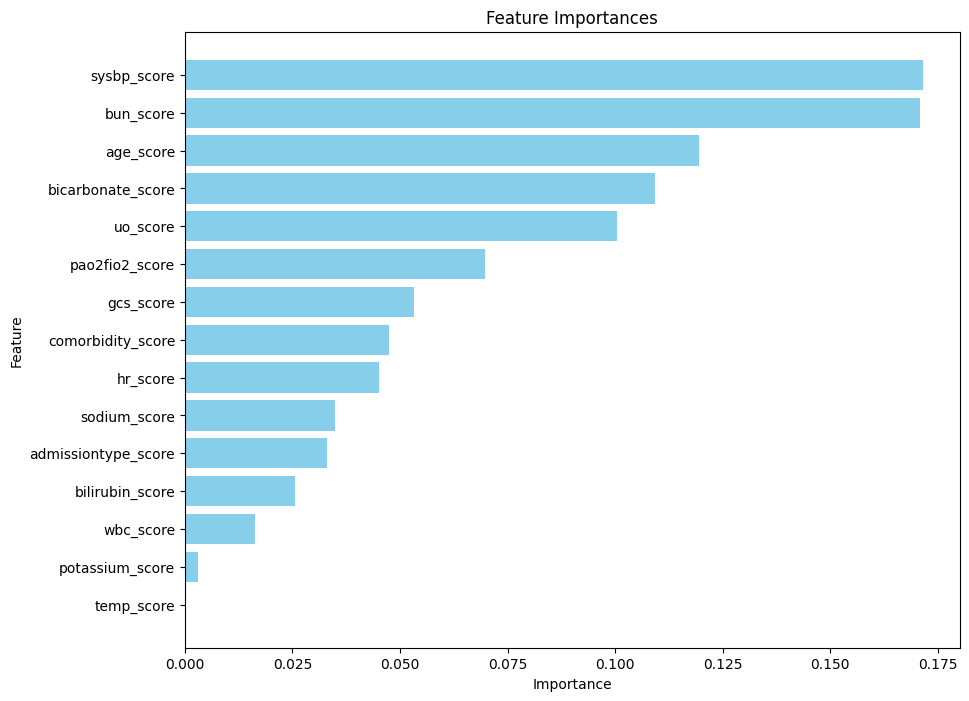

In [14]:
feature_importances_rf = model_rf.feature_importances_
feature_names_rf = X.columns
feature_importance_df_rf = pd.DataFrame({
    'Feature': feature_names_rf,
    'Importance': feature_importances_rf
})

feature_importance_df_rf = feature_importance_df_rf.sort_values(by='Importance', ascending=False)


plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df_rf['Feature'], feature_importance_df_rf['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.gca().invert_yaxis() 
plt.show()

# 5. XGBoost Model

In [15]:
# File path to the JSON file with the best configurations
config_file_path = Path("../hyperparameter_tuning_optuna/xgboost_sapsii_best_configs.json")

# Load the saved configuration (if it exists)
if config_file_path.exists():
    with open(config_file_path, "r") as config_file:
        best_configs = json.load(config_file)
else:
    raise FileNotFoundError(f"Configuration file not found at {config_file_path}")

# Extracting the best parameters
best_params = best_configs["best_params"]
print(json.dumps(best_params, indent=4))

{
    "learning_rate": 0.04104827611220117,
    "max_depth": 9,
    "min_child_weight": 7.019843175550228,
    "subsample": 0.9051666516306037,
    "colsample_bytree": 0.5941580627925221,
    "reg_alpha": 6.127711022894911,
    "reg_lambda": 1.2815178404061613,
    "scale_pos_weight": 4.984009429259703,
    "n_estimators": 274,
    "gamma": 3.351168498286658,
    "max_delta_step": 3.4207241011833798
}


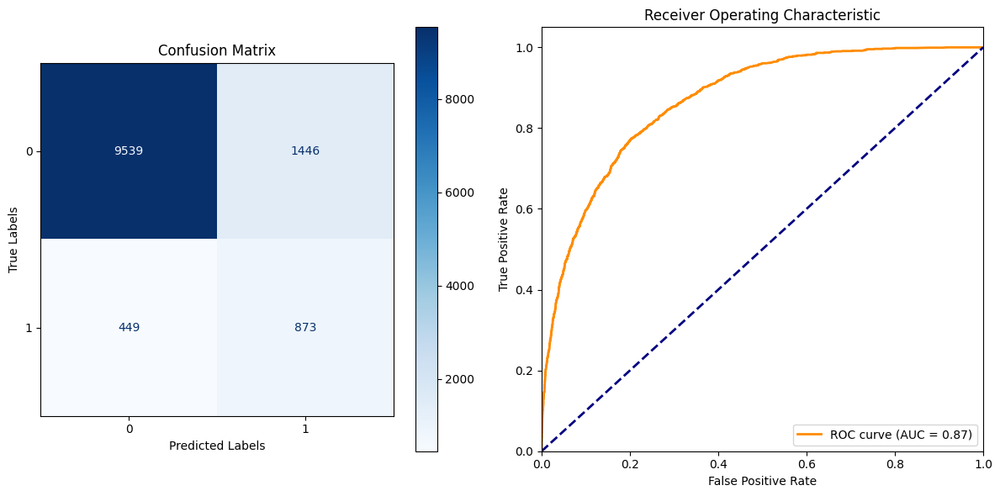

XGBoost Model: 

ROC AUC Score: 0.8695
Precision-Recall AUC Score: 0.5009
Training Accuracy: 0.8516
Test Accuracy: 0.8460
F1 Score: 0.4795

Confusion Matrix:
[[9539 1446]
 [ 449  873]]
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.87      0.91     10985
           1       0.38      0.66      0.48      1322

    accuracy                           0.85     12307
   macro avg       0.67      0.76      0.69     12307
weighted avg       0.89      0.85      0.86     12307



In [16]:
model_xgb, results_xgb = train_xgboost_model(X_train_scaled, y_train, X_test_scaled,**best_params)

evaluation_results_xgb = evaluate_model(y_test, results_xgb['y_pred'], results_xgb['y_pred_prob'])

print("XGBoost Model: \n")
print(f"ROC AUC Score: {evaluation_results_xgb['roc_auc']:.4f}")
print(f"Precision-Recall AUC Score: {evaluation_results_xgb['roc_prc']:.4f}")
print(f"Training Accuracy: {results_xgb['training_accuracy']:.4f}")
print(f"Test Accuracy: {evaluation_results_xgb['test_accuracy']:.4f}")
print(f"F1 Score: {evaluation_results_xgb['f1_score']:.4f}")

print("\nConfusion Matrix:")
print(evaluation_results_xgb['confusion_matrix'])

report_xgb = evaluation_results_xgb['classification_report']
print("Classification Report:\n", report_xgb)

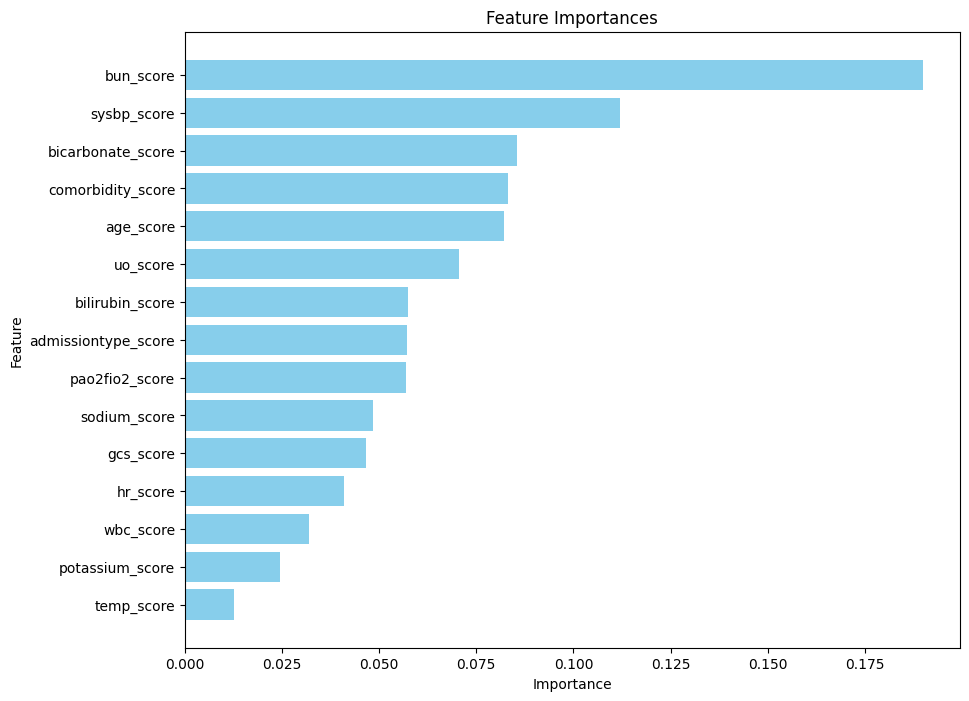

In [17]:
feature_importances_xgb = model_xgb.feature_importances_
feature_names_xgb = X.columns
feature_importance_df_xgb = pd.DataFrame({
    'Feature': feature_names_xgb,
    'Importance': feature_importances_xgb
})

feature_importance_df_xgb = feature_importance_df_xgb.sort_values(by='Importance', ascending=False)


plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df_xgb['Feature'], feature_importance_df_xgb['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.gca().invert_yaxis() 
plt.show()

# 6. Comparison of Scatter Plots of Features Against Models

In [48]:
df_vis = df.copy()

# Replace NaNs with 0
df_filtered_vis = df_vis.fillna(0)

# Separate features and target variable
y_vis = df_filtered_vis['mortality']
X_vis = df_filtered_vis.drop(columns=['mortality'])

# Split the balanced data into training and test sets
X_train_vis, X_test_vis, y_train_vis, y_test_vis = train_test_split(X_vis, y_vis, test_size=0.2, random_state=42, stratify=y_vis)

# Print class distribution after the split
print("Training set class distribution:")
print(y_train_vis.value_counts())

print("Test set class distribution:")
print(y_test_vis.value_counts())

Training set class distribution:
mortality
0    43938
1     5287
Name: count, dtype: int64
Test set class distribution:
mortality
0    10985
1     1322
Name: count, dtype: int64


In [50]:
df_vis_with_preds = X_test_vis.copy()
df_vis_with_preds['SAPSII'] = df_vis_with_preds["sapsii_prob"]
df_vis_with_preds['LR'] = results_lr['y_pred_prob']
df_vis_with_preds['EBM'] = results_ebm['y_pred_prob']
df_vis_with_preds['RF'] = results_rf['y_pred_prob']
df_vis_with_preds['XGB'] = results_xgb['y_pred_prob']
df_vis_with_preds = df_vis_with_preds.drop(columns=['sapsii_prob'])
df_vis_with_preds.head()

,subject_id,hadm_id,icustay_id,sapsii,age_score,hr_score,sysbp_score,temp_score,pao2fio2_score,uo_score,...,bicarbonate_score,bilirubin_score,gcs_score,comorbidity_score,admissiontype_score,SAPSII,LR,EBM,RF,XGB
33247,3275,164563,253969,36,15,2.0,5.0,0.0,6.0,0.0,...,0.0,0.0,0.0,0,8,0.181020,0.053187,0.050528,0.055395,0.242640
22543,17007,157566,236587,45,16,2.0,2.0,0.0,6.0,0.0,...,0.0,0.0,0.0,0,6,0.347723,0.215566,0.331683,0.178178,0.618578
59106,3101,116894,296030,32,7,4.0,0.0,0.0,0.0,0.0,...,3.0,0.0,0.0,9,6,0.128048,0.161065,0.166523,0.162248,0.532300
22909,5718,178439,237154,9,0,2.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,6,0.008131,0.009186,0.010515,0.038743,0.030742
1816,6454,139880,202914,39,15,2.0,5.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,8,0.229592,0.045774,0.045874,0.082729,0.223438


In [52]:
query = """
SELECT s.*, a.hospital_expire_flag as mortality
FROM sapsii_req_features s
LEFT JOIN admissions a
ON s.subject_id = a.subject_id
AND s.hadm_id = a.hadm_id;
"""

features_df  = execute_query(query)

Index(['subject_id', 'hadm_id', 'icustay_id', 'age', 'heartrate_max',
       'heartrate_min', 'sysbp_max', 'sysbp_min', 'tempc_max', 'tempc_min',
       'pao2fio2_vent_min', 'urineoutput', 'bun_min', 'bun_max', 'wbc_min',
       'wbc_max', 'potassium_min', 'potassium_max', 'sodium_min', 'sodium_max',
       'bicarbonate_min', 'bicarbonate_max', 'bilirubin_min', 'bilirubin_max',
       'mingcs', 'aids', 'hem', 'mets', 'admissiontype', 'mortality'],
      dtype='object')

In [54]:
# Process all features except categorical ones
def process_continuous_features(df: pd.DataFrame) -> pd.DataFrame:
    df['heartrate'] = (df['heartrate_max'] + df['heartrate_min']) / 2
    df['sysbp'] = (df['sysbp_max'] + df['sysbp_min']) / 2
    df['tempc'] = (df['tempc_max'] + df['tempc_min']) / 2
    df['bun'] = (df['bun_max'] + df['bun_min']) / 2
    df['wbc'] = (df['wbc_max'] + df['wbc_min']) / 2
    df['potassium'] = (df['potassium_max'] + df['potassium_min']) / 2
    df['sodium'] = (df['sodium_max'] + df['sodium_min']) / 2
    df['bicarbonate'] = (df['bicarbonate_max'] + df['bicarbonate_min']) / 2
    df['bilirubin'] = (df['bilirubin_max'] + df['bilirubin_min']) / 2

    # Rename pao2fio2_vent_min to pao2fio2
    df.rename(columns={'pao2fio2_vent_min': 'pao2fio2'}, inplace=True)

    # Drop min/max columns after averaging
    df.drop(columns=[
        'heartrate_max', 'heartrate_min', 'sysbp_max', 'sysbp_min', 
        'tempc_max', 'tempc_min', 'bun_max', 'bun_min', 'wbc_max', 'wbc_min',
        'potassium_max', 'potassium_min', 'sodium_max', 'sodium_min',
        'bicarbonate_max', 'bicarbonate_min', 'bilirubin_max', 'bilirubin_min'
    ], inplace=True)
    
    return df

In [55]:
features_df = process_continuous_features(features_df)
features_df.head()

,subject_id,hadm_id,icustay_id,age,pao2fio2,urineoutput,mingcs,aids,hem,mets,...,mortality,heartrate,sysbp,tempc,bun,wbc,potassium,sodium,bicarbonate,bilirubin
0,55973,152234,200001,61.071279,NaN,250.0,14.0,NaN,NaN,NaN,...,0,111.0,103.5,37.027778,83.0,2.85,4.45,139.0,28.0,0.20
1,27513,163557,200003,48.296271,NaN,3652.0,15.0,NaN,NaN,NaN,...,0,97.0,108.0,37.694444,20.0,29.35,3.15,142.0,21.5,3.65
2,10950,189514,200006,54.072308,NaN,1955.0,15.0,NaN,NaN,NaN,...,0,73.0,103.5,36.916667,13.5,9.40,3.85,136.0,31.5,NaN
3,20707,129310,200007,43.345013,NaN,1295.0,15.0,NaN,NaN,NaN,...,0,92.0,116.0,36.999999,10.5,9.55,4.15,137.5,23.0,NaN
4,29904,129607,200009,47.555978,322.499995,1570.0,15.0,NaN,NaN,NaN,...,0,97.0,108.0,36.449999,15.5,12.40,4.70,139.0,22.5,NaN


In [56]:
# Replace NaNs with 0
#features_df = features_df.fillna(0)

# Separate features and target variable
y_f = features_df['mortality']
X_features_df = features_df.drop(columns=['mortality'])

# Split the balanced data into training and test sets
X_train_features_df, X_test_features_df, y_train_f, y_test_f = train_test_split(X_features_df, y_f, test_size=0.2, random_state=42, stratify=y_f)

In [57]:
X_test_features_df.head()

,subject_id,hadm_id,icustay_id,age,pao2fio2,urineoutput,mingcs,aids,hem,mets,admissiontype,heartrate,sysbp,tempc,bun,wbc,potassium,sodium,bicarbonate,bilirubin
33247,3275,164563,253969,72.618818,356.0,2075.0,15.0,NaN,NaN,NaN,UnscheduledSurgical,84.0,137.0,37.055556,10.5,7.95,4.05,135.0,25.5,NaN
22543,17007,157566,236587,77.663257,215.0,2975.0,15.0,NaN,NaN,NaN,Medical,83.0,151.0,37.166665,36.0,23.85,4.05,142.5,30.0,0.4
59106,3101,116894,296030,41.809311,NaN,3420.0,15.0,NaN,NaN,1.0,Medical,123.5,146.5,38.111112,4.5,31.05,3.55,133.0,20.0,0.4
22909,5718,178439,237154,31.021117,NaN,1890.0,15.0,NaN,NaN,NaN,Medical,64.0,154.0,37.722221,10.0,13.75,3.95,141.0,23.0,0.3
1816,6454,139880,202914,74.844085,NaN,2340.0,15.0,NaN,NaN,NaN,UnscheduledSurgical,78.5,100.5,35.650000,59.0,13.20,4.75,138.5,25.0,NaN


In [58]:
# Step 3: Combine with Log-Odds DataFrame
combined_df = X_test_features_df[['subject_id', 'hadm_id', 'icustay_id', 'age', 'heartrate', 'sysbp', 
                           'tempc', 'pao2fio2', 'urineoutput', 'bun', 'wbc', 
                           'potassium', 'sodium', 'bicarbonate', 'bilirubin', 'mingcs']]

combined_df = combined_df.merge(
    df_vis_with_preds[['subject_id', 'hadm_id', 'icustay_id', 'comorbidity_score', 'admissiontype_score', 'SAPSII', 'LR', 'EBM', 'RF', 'XGB']],
    on=['subject_id', 'hadm_id', 'icustay_id'],
    how='left'
)

combined_df.head()

,subject_id,hadm_id,icustay_id,age,heartrate,sysbp,tempc,pao2fio2,urineoutput,bun,...,bicarbonate,bilirubin,mingcs,comorbidity_score,admissiontype_score,SAPSII,LR,EBM,RF,XGB
0,3275,164563,253969,72.618818,84.0,137.0,37.055556,356.0,2075.0,10.5,...,25.5,NaN,15.0,0,8,0.181020,0.053187,0.050528,0.055395,0.242640
1,17007,157566,236587,77.663257,83.0,151.0,37.166665,215.0,2975.0,36.0,...,30.0,0.4,15.0,0,6,0.347723,0.215566,0.331683,0.178178,0.618578
2,3101,116894,296030,41.809311,123.5,146.5,38.111112,NaN,3420.0,4.5,...,20.0,0.4,15.0,9,6,0.128048,0.161065,0.166523,0.162248,0.532300
3,5718,178439,237154,31.021117,64.0,154.0,37.722221,NaN,1890.0,10.0,...,23.0,0.3,15.0,0,6,0.008131,0.009186,0.010515,0.038743,0.030742
4,6454,139880,202914,74.844085,78.5,100.5,35.650000,NaN,2340.0,59.0,...,25.0,NaN,15.0,0,8,0.229592,0.045774,0.045874,0.082729,0.223438


In [61]:
# Plot continuous feature relationships with log-odds or probabilities, with a 6-column layout
def plot_feature_vs_logodds(df: pd.DataFrame, feature_name: str, logodds_columns: list):
    plt.figure(figsize=(20, 5))  # Wider figure for horizontal layout
    for i, col in enumerate(logodds_columns, start=1):
        plt.subplot(1, 6, i)  # 1 row, 6 columns
        sns.scatterplot(x=df[feature_name], y=df[col], alpha=0.3, label=col)
        plt.title(f"{feature_name} vs {col}")
        plt.xlabel(feature_name)
        plt.ylabel("Log-Odds or Probability")

    # Histogram in the last subplot (6th column)
    plt.subplot(1, 6, len(logodds_columns) + 1)
    sns.histplot(df[feature_name].dropna(), kde=True, color='blue', alpha=0.4)  # Exclude NaNs from histogram
    plt.title(f"Histogram of {feature_name} (excluding NaNs)")
    
    plt.tight_layout()
    plt.show()

# Plot categorical feature relationships with log-odds or probabilities, with a 6-column layout
def plot_categorical_vs_logodds(df: pd.DataFrame, feature_name: str, logodds_columns: list):
    plt.figure(figsize=(20, 5))  # Wider figure for horizontal layout
    for i, col in enumerate(logodds_columns, start=1):
        plt.subplot(1, 6, i)  # 1 row, 6 columns
        sns.boxplot(x=df[feature_name], y=df[col])
        plt.title(f"{feature_name} vs {col}")
        plt.xlabel(feature_name)
        plt.ylabel("Log-Odds or Probability")

    plt.tight_layout()
    plt.show()


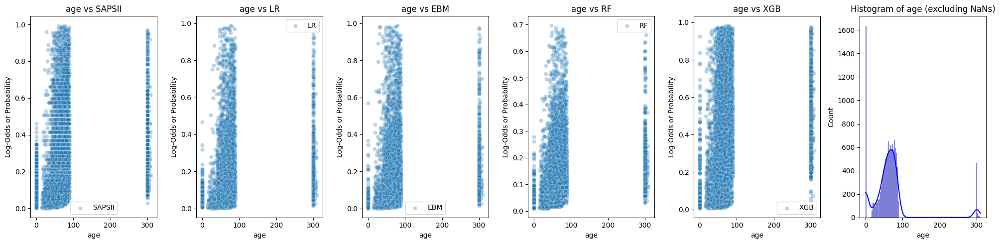

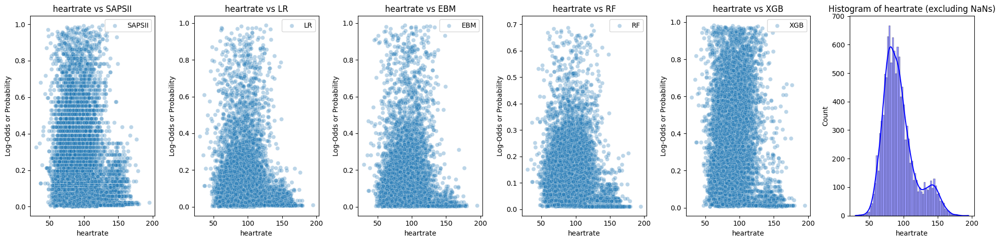

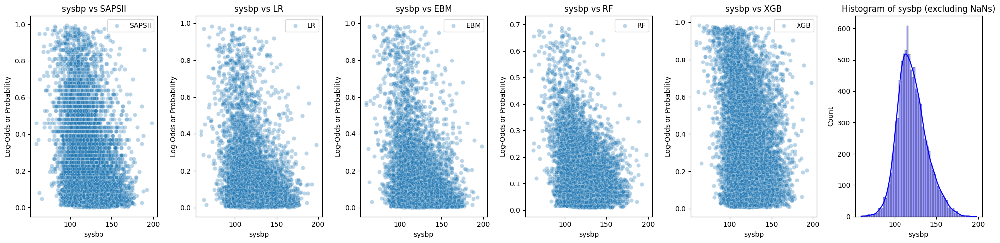

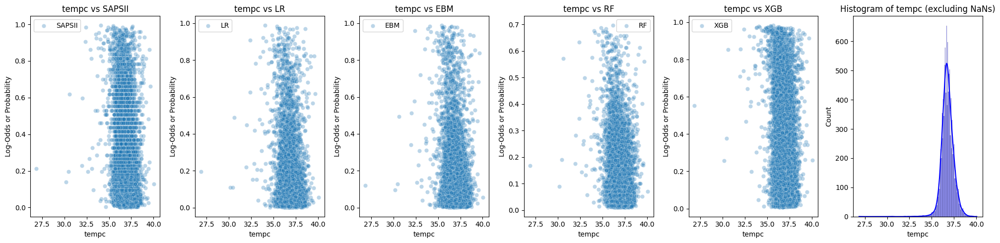

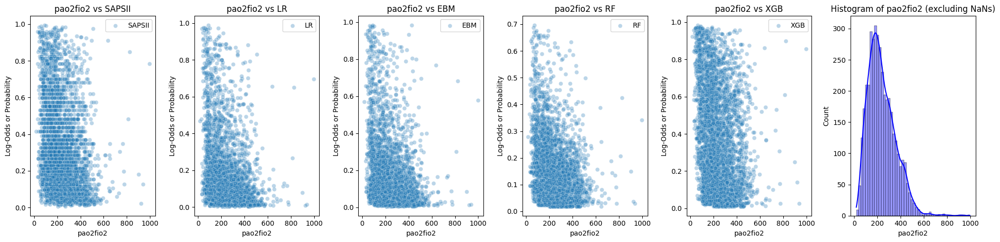

...

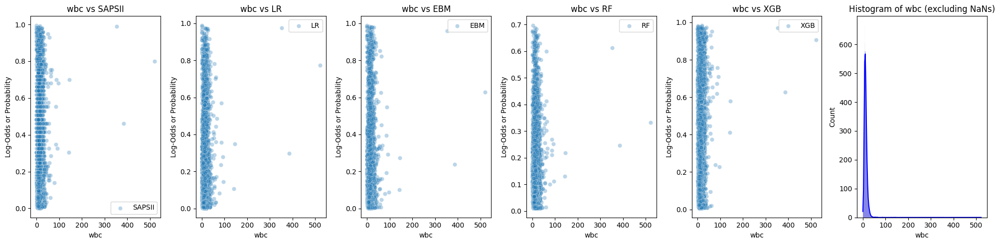

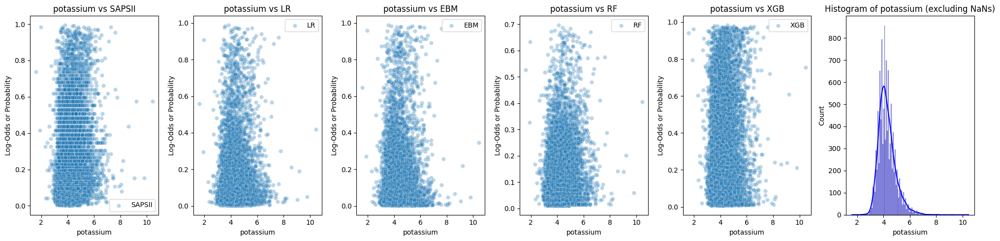

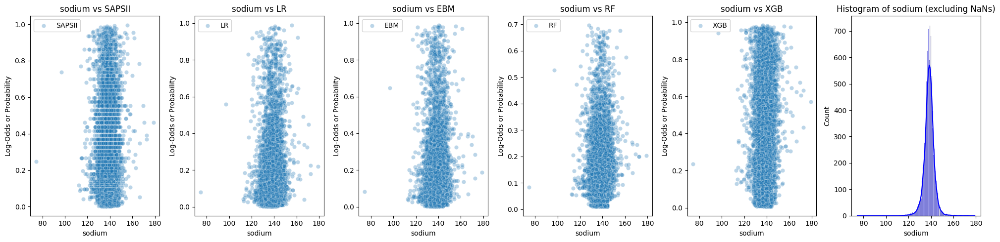

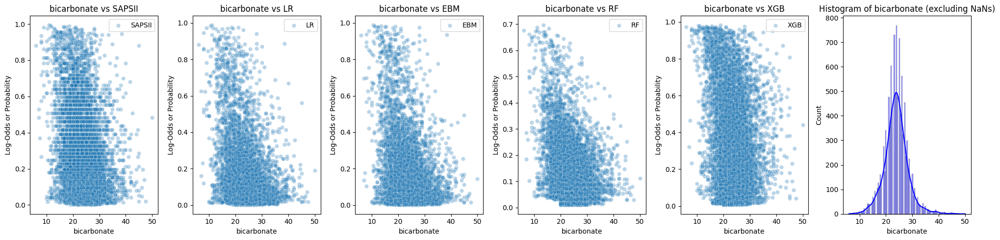

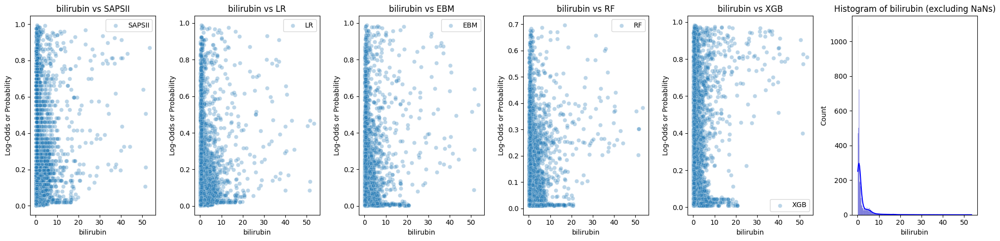

In [62]:
# Step 4: Plot Continuous Feature Relationships
continuous_features = ['age', 'heartrate', 'sysbp', 'tempc', 'pao2fio2', 'urineoutput', 
                       'bun', 'wbc', 'potassium', 'sodium', 'bicarbonate', 'bilirubin']
logodds_columns = ['SAPSII', 'LR', 'EBM', 'RF', 'XGB']

for feature in continuous_features:
    plot_feature_vs_logodds(combined_df, feature, logodds_columns)


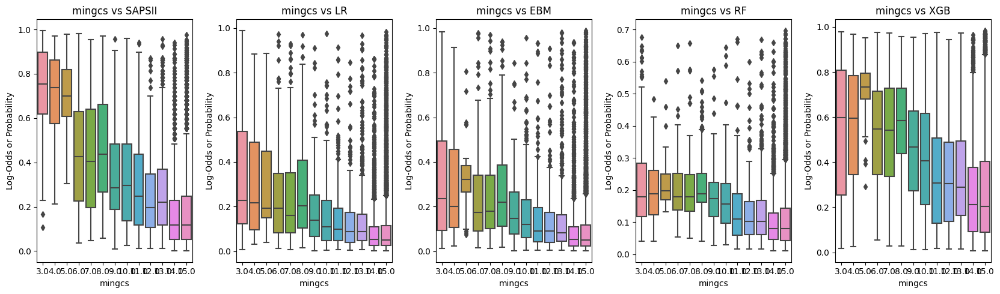

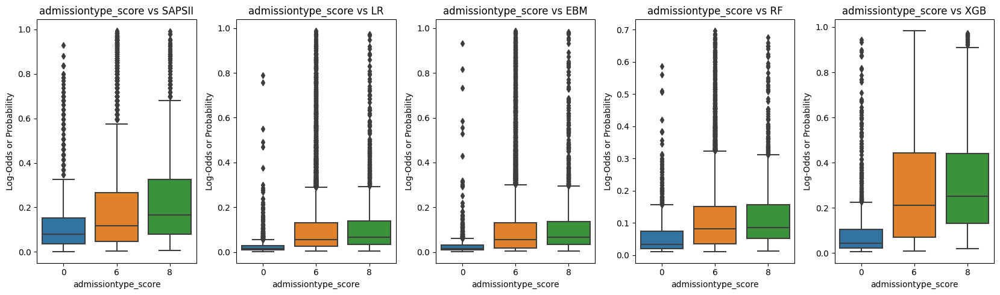

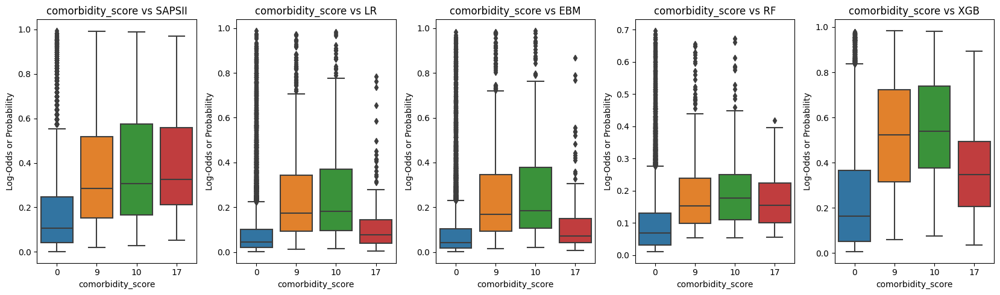

In [63]:

# Step 5: Plot Categorical Feature Relationships
plot_categorical_vs_logodds(combined_df,'mingcs', logodds_columns)
plot_categorical_vs_logodds(combined_df, 'admissiontype_score', logodds_columns)
plot_categorical_vs_logodds(combined_df, 'comorbidity_score', logodds_columns)

# 7. SHAP Values of the Models

## 7.1 LogisticGam SHAP Plost

  0%|          | 0/3000 [00:00<?, ?it/s]

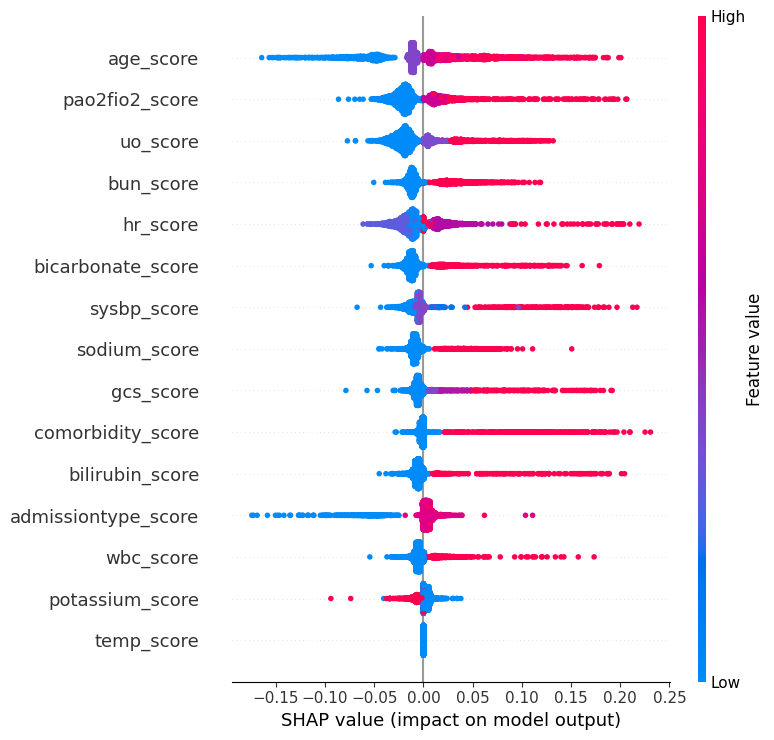

In [87]:
def stratified_shap_sample(X, y, sample_size=50, columns=None, random_state=42):
    """Perform stratified sampling with shap.sample while preserving class distribution."""
    # Combine X and y into a DataFrame for easier sampling
    combined_data = pd.DataFrame(X, columns=columns)
    combined_data['target'] = y

    # Perform stratified sampling manually to maintain class proportions
    stratified_data = combined_data.groupby('target', group_keys=False).apply(
        lambda x: x.sample(min(len(x), sample_size // len(combined_data['target'].unique())), random_state=random_state)
    )
    
    return stratified_data.drop(columns='target').values  # Drop the target column for background data

# Assuming X_train_scaled is a NumPy array and we have the column names in X.columns
background_data_lr = stratified_shap_sample(X_train_scaled, y_train, sample_size=50, columns=X.columns)

# Function to predict probabilities using the trained LogisticGAM model
def predict_gam_proba(X):
    return model_lr.predict_proba(X)

# Use the KernelExplainer for SHAP values with stratified background data
explainer_lr = shap.KernelExplainer(predict_gam_proba, background_data_lr)

# Example: Selecting a random subset of X_test_scaled using NumPy
subset_size = 3000  # Choose an appropriate subset size based on your data
subset_indices = np.random.choice(X_test_scaled.shape[0], size=subset_size, replace=False)
X_test_subset = X_test_scaled[subset_indices]

# Compute SHAP values using the subset
shap_values_lr = explainer_lr.shap_values(X_test_subset, nsamples=50)


# Plot SHAP summary plot
shap.summary_plot(shap_values_lr, X_test_subset, feature_names=X.columns)


In [80]:
# Initialize JavaScript for SHAP visualizations
shap.initjs()
# Plot force plot for the first instance in X_test_subset
shap.force_plot(explainer_lr.expected_value, shap_values_lr[0], X_test_subset[0], feature_names=X.columns)


In [122]:
# Step 1: Define a probability prediction function for model_lr
def predict_lr_proba(X):
    """Wrap the model's prediction to return probabilities for both classes."""
    # Assuming model_lr returns a probability of the positive class (class 1)
    # Let's use that to generate a probability distribution for LIME
    
    class_1_probs = model_lr.predict_proba(X)  # Get probability of class 1 directly if available
    
    # Check if only one column of probabilities is returned (for the positive class)
    if class_1_probs.ndim == 1 or class_1_probs.shape[1] == 1:
        class_1_probs = class_1_probs.flatten()  # Ensure it's a 1D array
        class_0_probs = 1 - class_1_probs  # Calculate class 0 probabilities
        return np.column_stack((class_0_probs, class_1_probs))  # Stack them into a 2D array
    return class_1_probs  # Otherwise, assume probabilities for both classes are returned

# Step 2: Initialize the LIME Tabular Explainer for Logistic Regression model
explainer_lr = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,            # Scaled training data
    feature_names=X.columns,                # Feature names from your original DataFrame
    class_names=['Negative', 'Positive'],   # Class names for binary classification (adjust if needed)
    mode='classification'                   # Since this is a classification problem
)

# Step 3: Choose an instance from your test set to explain
instance_to_explain_lr = X_test_scaled[1].reshape(1, -1)

# Step 4: Generate an explanation for the chosen instance
explanation_lr = explainer_lr.explain_instance(
    data_row=instance_to_explain_lr.flatten(),   # The specific instance to explain
    predict_fn=predict_lr_proba                  # Custom probability prediction function
)

# Step 5: Visualize the explanation in a notebook or save it as HTML
explanation_lr.show_in_notebook(show_table=True)  # For Jupyter notebooks

# Or save the explanation to an HTML file for viewing in a browser
explanation_lr.save_to_file("lime_explanation_lr.html")


[ 3.37206468e-03  1.05630942e-03  2.92516454e-03  4.87527423e-05
  8.61298448e-04  2.99016820e-03  6.01283822e-04 -1.38132770e-04
  2.11261883e-04  2.11261883e-04  2.29950435e-03  2.14512066e-03
  1.23506947e-03  1.99073698e-03  6.66287479e-04]


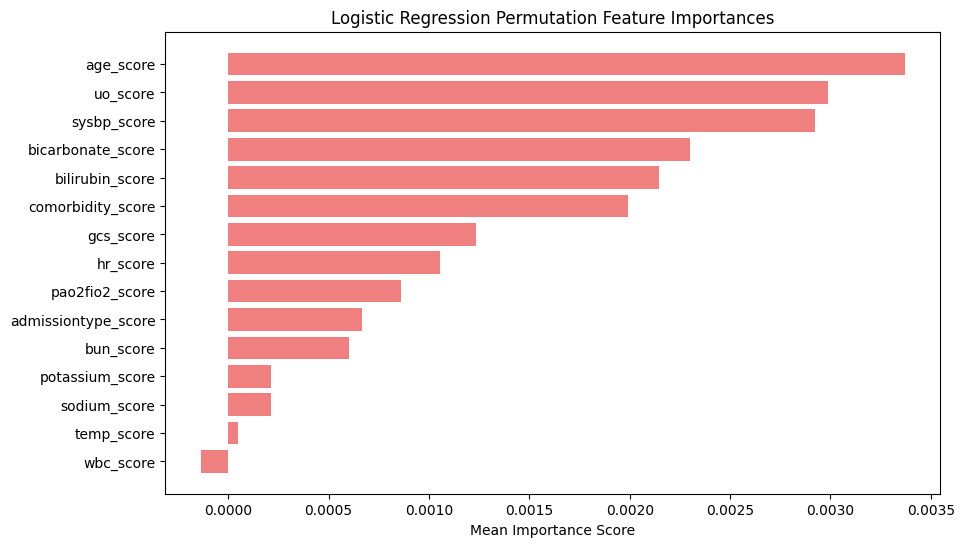

In [128]:
# Permutation Importance for model_lr (Logistic Regression)
results_lr = permutation_importance(model_lr, X_test_scaled, y_test, n_repeats=10, random_state=42)
importances_lr = results_lr.importances_mean
print(importances_lr)

# Plotting Permutation Importances for model_lr
sorted_idx_lr = np.argsort(importances_lr)[::-1]  # Sort in descending order

plt.figure(figsize=(10, 6))
plt.barh(feature_names[sorted_idx_lr], importances_lr[sorted_idx_lr], color='lightcoral')
plt.xlabel("Mean Importance Score")
plt.title("Logistic Regression Permutation Feature Importances")
plt.gca().invert_yaxis()  # Invert y-axis to display the most important feature at the top
plt.show()


## 7.2. EBM SHAP Plots

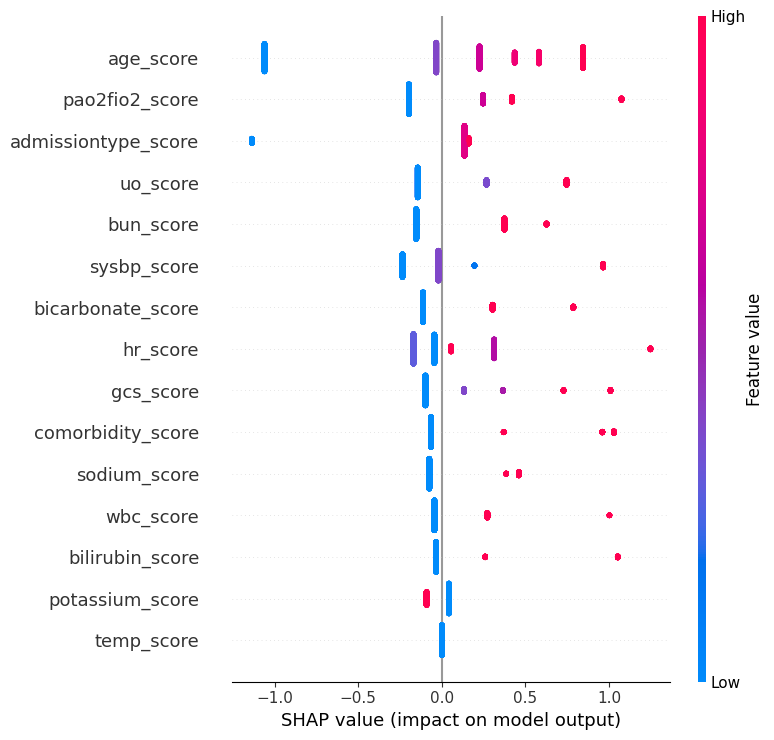

  0%|          | 0/3000 [00:00<?, ?it/s]

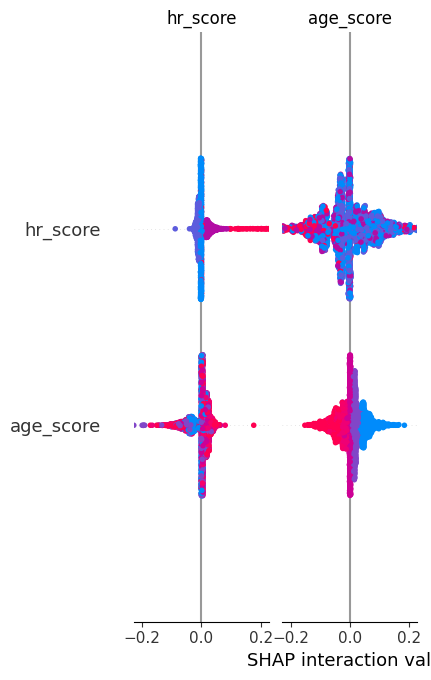

In [90]:
# Step 1: Define the prediction function for SHAP
def predict_ebm_proba(X):
    """Returns predicted probabilities using the trained EBM model."""
    return model_ebm.predict_proba(X)

# Step 2: Take a subset of X_test_scaled
# Assuming X_test_scaled is a NumPy array and X is the original DataFrame with column names
subset_size = 3000  # Choose an appropriate subset size based on your data

# Convert X_test_scaled to a DataFrame to perform sampling
X_test_df = pd.DataFrame(X_test_scaled, columns=X.columns)

# Select a random subset
X_test_subset = X_test_df.sample(n=subset_size, random_state=42).values  # Convert back to NumPy array

# Step 3: Use the SHAP AdditiveExplainer for EBM without interactions
explainer_ebm = shap.Explainer(model_ebm, X_train_scaled)  # Automatically selects AdditiveExplainer

# Step 4: Compute SHAP values for the subset of test data
shap_values_ebm = explainer_ebm(X_test_subset)

# Step 5: Plot SHAP values using a summary plot (beeswarm plot)
shap.summary_plot(shap_values_ebm, X_test_subset, plot_type="dot", feature_names=X.columns)

X_test_df = pd.DataFrame(X_test_scaled, columns=X.columns)

# Select a random subset
X_test_subset = X_test_df.sample(n=subset_size, random_state=42).values  # Convert back to NumPy array

# Step 3: Use KernelExplainer for SHAP values with a representative background data
background_data_ebm = shap.sample(X_train_scaled, 50)  # Use 50 samples from training data for background
explainer_ebm = shap.KernelExplainer(predict_ebm_proba, background_data_ebm)

# Step 4: Compute SHAP values for the subset of test data
shap_values_ebm = explainer_ebm.shap_values(X_test_subset, nsamples=50)  # Adjust nsamples as needed

# Step 5: Plot SHAP values using a summary plot (beeswarm plot)
shap.summary_plot(shap_values_ebm, X_test_subset, plot_type="dot", feature_names=X.columns)


In [116]:
# Step 1: Initialize the LIME Tabular Explainer for EBM
explainer_ebm = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,            # Scaled training data
    feature_names=X.columns,                # Feature names from your original DataFrame
    class_names=['Negative', 'Positive'],   # Class names for binary classification (adjust if needed)
    mode='classification'                   # Since this is a classification problem
)

# Step 2: Choose an instance from your test set to explain
instance_to_explain_ebm = X_test_scaled[1].reshape(1, -1)

# Step 3: Generate an explanation for the chosen instance
explanation_ebm = explainer_ebm.explain_instance(
    data_row=instance_to_explain_ebm.flatten(),   # The specific instance to explain
    predict_fn=model_ebm.predict_proba            # Prediction function (model’s probability predictions)
)

# Step 4: Visualize the explanation in a notebook or save it as HTML
explanation_ebm.show_in_notebook(show_table=True)  # For Jupyter notebooks

# Or save the explanation to an HTML file for viewing in a browser
explanation_ebm.save_to_file("lime_explanation_ebm.html")


[ 2.42138620e-03  1.16194036e-03  3.20143008e-03  4.87527423e-05
  9.34427562e-04  2.87641180e-03  4.38774681e-04 -5.28154709e-04
  3.81896482e-04  2.51889169e-04  2.08824246e-03  1.93385878e-03
  1.12131307e-03  2.30762980e-03  5.03778338e-04]


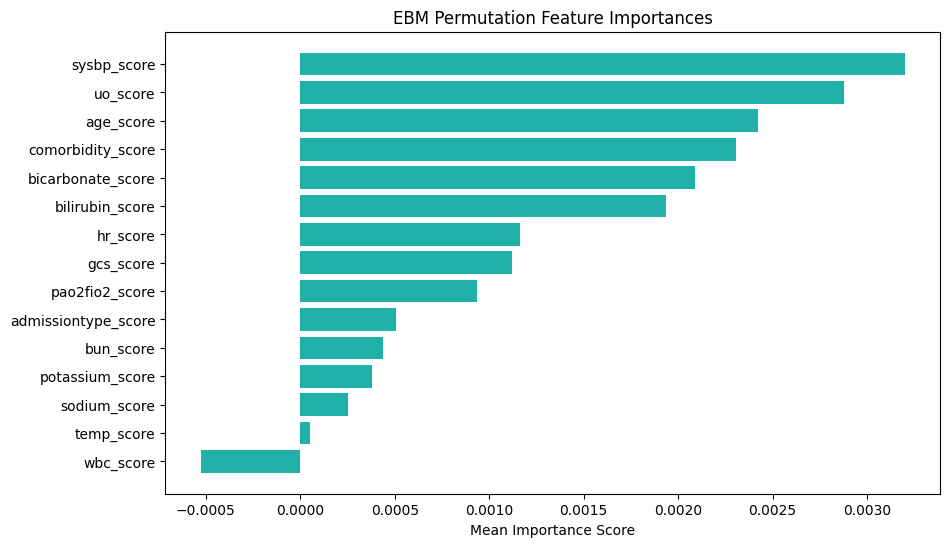

In [129]:
# Permutation Importance for model_ebm (EBM)
results_ebm = permutation_importance(model_ebm, X_test_scaled, y_test, n_repeats=10, random_state=42)
importances_ebm = results_ebm.importances_mean
print(importances_ebm)

# Plotting Permutation Importances for model_ebm
sorted_idx_ebm = np.argsort(importances_ebm)[::-1]  # Sort in descending order

plt.figure(figsize=(10, 6))
plt.barh(feature_names[sorted_idx_ebm], importances_ebm[sorted_idx_ebm], color='lightseagreen')
plt.xlabel("Mean Importance Score")
plt.title("EBM Permutation Feature Importances")
plt.gca().invert_yaxis()  # Invert y-axis to display the most important feature at the top
plt.show()


## 7.3. Random Forest SHAP Values

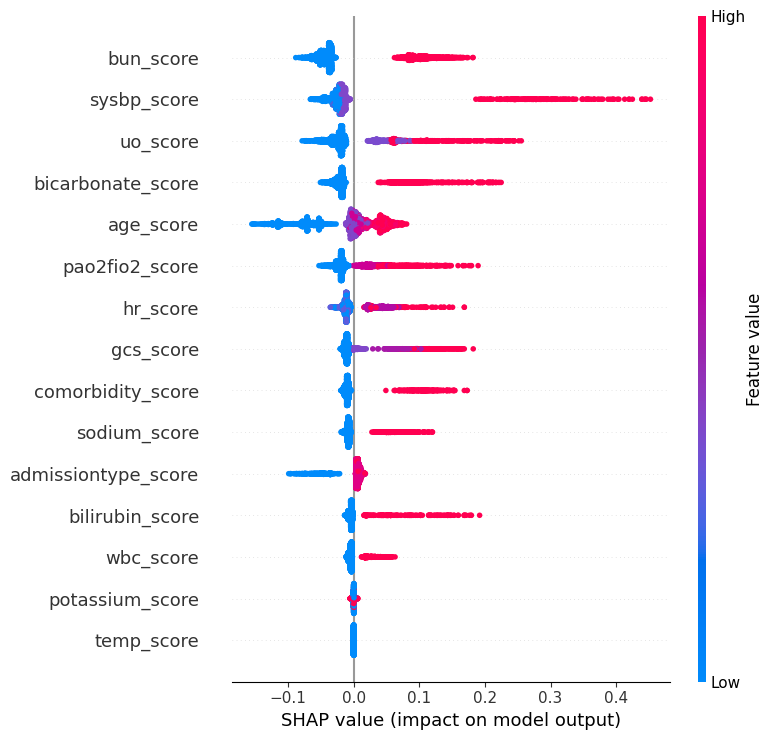

In [107]:
# Step 1: Take a subset of X_test_scaled
subset_size = 3000  # Choose an appropriate subset size based on your data

# Convert X_test_scaled to a DataFrame to perform sampling
X_test_df = pd.DataFrame(X_test_scaled, columns=X.columns)

# Select a random subset
X_test_subset = X_test_df.sample(n=subset_size, random_state=42).values  # Convert back to NumPy array

# Step 2: Initialize the SHAP TreeExplainer for the Random Forest model
explainer_rf = shap.TreeExplainer(model_rf)

# Step 3: Compute SHAP values for the subset of test data
shap_values_rf = explainer_rf.shap_values(X_test_subset)

# Step 4: Extract SHAP values for each class separately
shap_values_class_0 = shap_values_rf[:, :, 0]  
shap_values_class_1 = shap_values_rf[:, :, 1]  

shap_values_combined = shap_values_class_1 - shap_values_class_0


# Step 5: Plot SHAP values using a summary plot (beeswarm plot) for class 1
shap.summary_plot(shap_values_combined, X_test_subset, plot_type="dot", feature_names=X.columns)

In [108]:
# Ensure that JavaScript is initialized for SHAP visualizations
shap.initjs()

# Plot force plot for the first instance in X_test_subset for class 1
shap.force_plot(
    explainer_rf.expected_value[1],       # The base value for class 1
    shap_values_combined[0],               # SHAP values for the first instance for class 1
    X_test_subset[0],                     # Feature values for the first instance
    feature_names=X.columns               # Names of the features
)


In [114]:
# Step 1: Initialize the LIME Tabular Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,            # Scaled training data
    feature_names=X.columns,                # Feature names from your original DataFrame
    class_names=['Negative', 'Positive'],   # Class names for binary classification (adjust if needed)
    mode='classification'                   # Since this is a classification problem
)

# Step 2: Choose an instance from your test set to explain
instance_to_explain = X_test_scaled[1].reshape(1, -1)

# Step 3: Generate an explanation for the chosen instance
explanation = explainer.explain_instance(
    data_row=instance_to_explain.flatten(),   # The specific instance to explain
    predict_fn=model_rf.predict_proba         # Prediction function (model’s probability predictions)
)

# Step 4: Visualize the explanation in a notebook or save it as HTML
explanation.show_in_notebook(show_table=True)  # For Jupyter notebooks

# Or save the explanation to an HTML file for viewing in a browser
explanation.save_to_file("lime_explanation_rf.html")


[ 5.68781994e-04  8.53172991e-04  5.28154709e-03  0.00000000e+00
  3.49394653e-04  4.72089055e-03  8.53172991e-04 -5.68781994e-05
  6.50036565e-05  8.93800276e-05  2.38075892e-03  5.93158365e-04
  8.93800276e-05 -4.87527423e-05  1.86885512e-04]


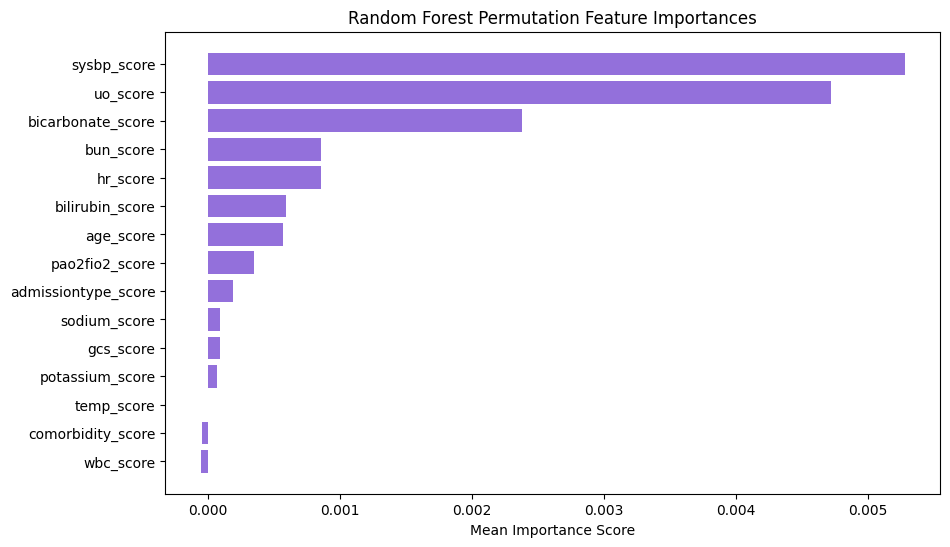

In [130]:
# Permutation Importance for model_rf (Random Forest)
results_rf = permutation_importance(model_rf, X_test_scaled, y_test, n_repeats=10, random_state=42)
importances_rf = results_rf.importances_mean
print(importances_rf)
# Plotting Permutation Importances for model_rf
sorted_idx_rf = np.argsort(importances_rf)[::-1]  # Sort in descending order

plt.figure(figsize=(10, 6))
plt.barh(feature_names[sorted_idx_rf], importances_rf[sorted_idx_rf], color='mediumpurple')
plt.xlabel("Mean Importance Score")
plt.title("Random Forest Permutation Feature Importances")
plt.gca().invert_yaxis()  # Invert y-axis to display the most important feature at the top
plt.show()


## 7.4. XGBoost SHAP Plots

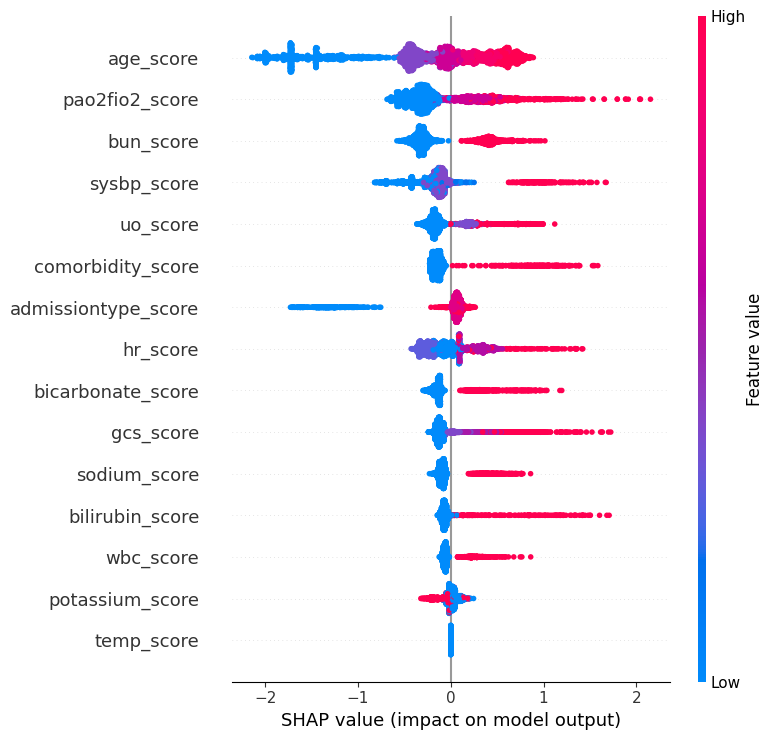

In [102]:
# Step 1: Take a subset of X_test_scaled
subset_size = 3000  # Choose an appropriate subset size based on your data

# Convert X_test_scaled to a DataFrame to perform sampling
X_test_df = pd.DataFrame(X_test_scaled, columns=X.columns)

# Select a random subset
X_test_subset = X_test_df.sample(n=subset_size, random_state=42).values  # Convert back to NumPy array

# Step 2: Initialize the SHAP TreeExplainer for the XGBoost model
explainer_xgb = shap.TreeExplainer(model_xgb)

# Step 3: Compute SHAP values for the subset of test data
shap_values_xgb = explainer_xgb.shap_values(X_test_subset)


# Step 4: Plot SHAP values using a summary plot (beeswarm plot) for the combined effect
shap.summary_plot(shap_values_xgb, X_test_subset, plot_type="dot", feature_names=X.columns)


In [103]:
# Ensure that JavaScript is initialized for SHAP visualizations
shap.initjs()

# Plot force plot for the first instance in X_test_subset for class 1
shap.force_plot(
    explainer_xgb.expected_value,  # The base value for class 1
    shap_values_xgb[0],           # SHAP values for the first instance for class 1
    X_test_subset[0],                 # Feature values for the first instance
    feature_names=X.columns           # Names of the features
)


In [119]:
# Step 1: Initialize the LIME Tabular Explainer for XGBoost model
explainer_xgb = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,            # Scaled training data
    feature_names=X.columns,                # Feature names from your original DataFrame
    class_names=['Negative', 'Positive'],   # Class names for binary classification (adjust if needed)
    mode='classification'                   # Since this is a classification problem
)

# Step 2: Choose an instance from your test set to explain
instance_to_explain_xgb = X_test_scaled[1].reshape(1, -1)

# Step 3: Generate an explanation for the chosen instance
explanation_xgb = explainer_xgb.explain_instance(
    data_row=instance_to_explain_xgb.flatten(),   # The specific instance to explain
    predict_fn=model_xgb.predict_proba            # Prediction function (model’s probability predictions)
)

# Step 4: Visualize the explanation in a notebook or save it as HTML
explanation_xgb.show_in_notebook(show_table=True)  # For Jupyter notebooks

# Or save the explanation to an HTML file for viewing in a browser
explanation_xgb.save_to_file("lime_explanation_xgb.html")


[ 6.06971642e-03  8.73486634e-03  7.97107337e-03  8.12545706e-06
  1.31632404e-02  8.24733891e-03 -8.69423905e-04  3.41269196e-04
  3.57520111e-03 -1.03193305e-03  9.10051190e-04  5.98846185e-03
  6.15097099e-03  5.63094174e-03  2.07199155e-03]


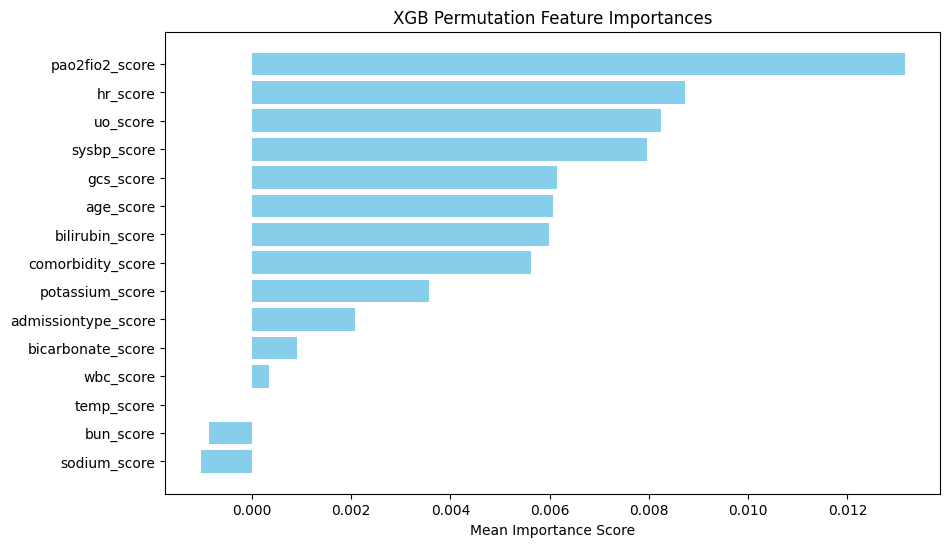

In [131]:
# Step 1: Calculate Permutation Importance for model_xgb
results_xgb = permutation_importance(model_xgb, X_test_scaled, y_test, n_repeats=10, random_state=42)
importances_xgb = results_xgb.importances_mean
print(importances_xgb)

# Step 2: Get the feature names
feature_names = X.columns

# Step 3: Create a sorted list of feature importances and corresponding feature names
sorted_idx_xgb = np.argsort(importances_xgb)[::-1]  # Sort in descending order

# Step 4: Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_names[sorted_idx_xgb], importances_xgb[sorted_idx_xgb], color='skyblue')
plt.xlabel("Mean Importance Score")
plt.title("XGB Permutation Feature Importances")
plt.gca().invert_yaxis()  # Invert y-axis to display the most important feature at the top
plt.show()


# Thanks